<a href="https://colab.research.google.com/github/KamaruddinSk/Detectron2/blob/master/Detectron2_with_BCCD_dataset.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Implementation of Detectron2 for object detection with BCCD dataset from Roboflow

In [1]:
# install dependencies: (use cu101 because colab has CUDA 10.1)
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html

Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
Requirement already up-to-date: torch==1.5 in /usr/local/lib/python3.6/dist-packages (1.5.0+cu101)
Requirement already up-to-date: torchvision==0.6 in /usr/local/lib/python3.6/dist-packages (0.6.0+cu101)


In [2]:
!pip install cython pyyaml==5.1

In [3]:
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'

  Cloning https://github.com/cocodataset/cocoapi.git to /tmp/pip-req-build-k3kia0fq
  Running command git clone -q https://github.com/cocodataset/cocoapi.git /tmp/pip-req-build-k3kia0fq
  Created wheel for pycocotools: filename=pycocotools-2.0-cp36-cp36m-linux_x86_64.whl size=266458 sha256=c96501cc126bf7226d0302c20c0128922bbc6068b99ee4a00222d8582af10c6c
  Stored in directory: /tmp/pip-ephem-wheel-cache-jopndotx/wheels/90/51/41/646daf401c3bc408ff10de34ec76587a9b3ebfac8d21ca5c3a
Successfully built pycocotools
  Found existing installation: pycocotools 2.0.2
    Uninstalling pycocotools-2.0.2:
      Successfully uninstalled pycocotools-2.0.2


In [4]:
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

1.5.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [5]:
# install detectron2:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html


In [6]:
# You may need to restart your runtime prior to this, to let your installation take effect
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

<Logger detectron2 (DEBUG)>

In [7]:
# import some common libraries
import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

In [8]:
!curl -L "{https://public.roboflow.com/ds/ExHcB6BxpA?key=nH9zKfJAMx}" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   887  100   887    0     0   1272      0 --:--:-- --:--:-- --:--:--  1272
100 6374k  100 6374k    0     0  3924k      0  0:00:01  0:00:01 --:--:-- 6981k
Archive:  roboflow.zip
 extracting: train/BloodImage_00240_jpg.rf.02e03d6cdaa6a0c4446fbede5b024dd2.jpg  
 extracting: train/BloodImage_00196_jpg.rf.03390ec25911b1035cae7b7ea3b8245d.jpg  
 extracting: train/BloodImage_00053_jpg.rf.039e0e2cfc3db970127dbb3f4ae9ee6d.jpg  
 extracting: train/BloodImage_00256_jpg.rf.03ae10c8cb261253736684b6b1774dc4.jpg  
 extracting: train/BloodImage_00018_jpg.rf.02cc3c42d3b2af24c2432c9ec88bb492.jpg  
 extracting: test/BloodImage_00190_jpg.rf.03484116dcad7715c77d30654056fc54.jpg  
 extracting: valid/BloodImage_00377_jpg.rf.0312942b2d584915ce2498b70b4c7fd9.jpg  
 extracting: train/BloodImage_00320_jpg.rf.0162f52310ba3d29d7a1a9cd30a43488.jpg  
 extra

In [9]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")


WARNING [09/23 04:40:31 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[09/23 04:40:31 d2.data.datasets.coco]: Loaded 255 images in COCO format from /content/train/_annotations.coco.json


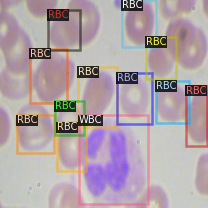

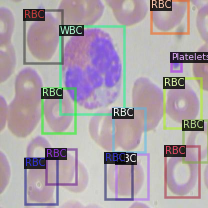

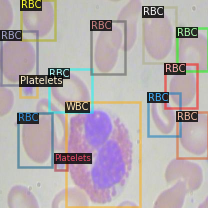

In [10]:
#visualize training data
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

## **Train Custom Detectron2 Detector**

In [11]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [12]:
#from .detectron2.tools.train_net import Trainer
#from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.001


cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 1500 #adjust up if val mAP is still rising, adjust down if overfit
cfg.SOLVER.STEPS = (1000, 1500)
cfg.SOLVER.GAMMA = 0.05




cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 4 #your number of classes + 1

cfg.TEST.EVAL_PERIOD = 500


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[09/23 04:40:36 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_68b088.pkl: 421MB [00:37, 11.3MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (5, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (5,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (16, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (16,) in the model! You might want to double check if this is expected.


[09/23 04:41:19 d2.engine.train_loop]: Starting training from iteration 0
[09/23 04:41:42 d2.utils.events]:  eta: 0:28:56  iter: 19  total_loss: 3.187  loss_cls: 1.552  loss_box_reg: 0.863  loss_rpn_cls: 0.762  loss_rpn_loc: 0.068  time: 1.1667  data_time: 0.0320  lr: 0.000020  max_mem: 7215M
[09/23 04:42:06 d2.utils.events]:  eta: 0:28:36  iter: 39  total_loss: 2.299  loss_cls: 1.275  loss_box_reg: 0.867  loss_rpn_cls: 0.083  loss_rpn_loc: 0.060  time: 1.1691  data_time: 0.0131  lr: 0.000040  max_mem: 7215M
[09/23 04:42:29 d2.utils.events]:  eta: 0:28:19  iter: 59  total_loss: 1.855  loss_cls: 0.855  loss_box_reg: 0.846  loss_rpn_cls: 0.058  loss_rpn_loc: 0.058  time: 1.1730  data_time: 0.0140  lr: 0.000060  max_mem: 7215M
[09/23 04:42:53 d2.utils.events]:  eta: 0:28:04  iter: 79  total_loss: 1.653  loss_cls: 0.687  loss_box_reg: 0.854  loss_rpn_cls: 0.043  loss_rpn_loc: 0.054  time: 1.1758  data_time: 0.0131  lr: 0.000080  max_mem: 7216M
[09/23 04:43:17 d2.utils.events]:  eta: 0:27:4

In [13]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [14]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [09/23 05:11:41 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[09/23 05:11:41 d2.data.datasets.coco]: Loaded 36 images in COCO format from /content/test/_annotations.coco.json
[09/23 05:11:41 d2.data.build]: Distribution of instances among all 4 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|   cells    | 0            | Platelets  | 36           |    RBC     | 398          |
|    WBC     | 37           |            |              |            |              |
|   total    | 471          |            |              |            |              |
[09/23 05:11:41 d2.data.common]: Serializing 36 elements to byte tensors and concatenating them all ...
[09/23 05:11:41 d2.data.common]: Serialized dataset takes 0.03 MiB
[09/23 05:11:41 d2.evaluation.evaluator]: Start inference on 36 i

OrderedDict([('bbox',
              {'AP': 58.248154498986246,
               'AP-Platelets': 40.23097849212714,
               'AP-RBC': 60.08435870371864,
               'AP-WBC': 74.42912630111296,
               'AP-cells': nan,
               'AP50': 87.62128968542933,
               'AP75': 64.21937430966882,
               'APl': 39.3218090895111,
               'APm': 56.83759580172795,
               'APs': 19.153851803544246})])

## **Inference with Detectron2 Saved Weights**

In [15]:
%ls ./output/

coco_instances_results.json                        last_checkpoint
events.out.tfevents.1600836037.f9c9fdf76bac.302.0  metrics.json
instances_predictions.pth                          model_final.pth


In [16]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

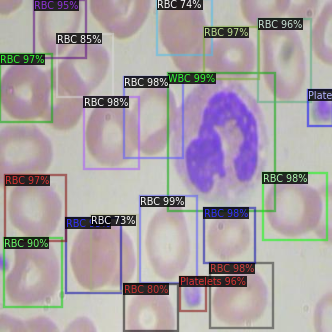

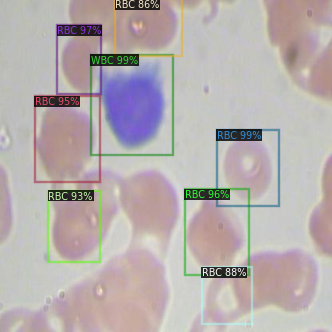

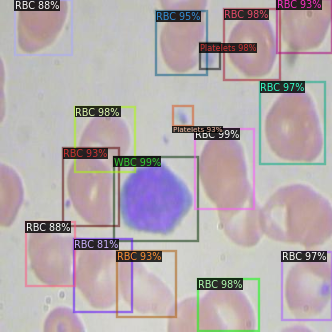

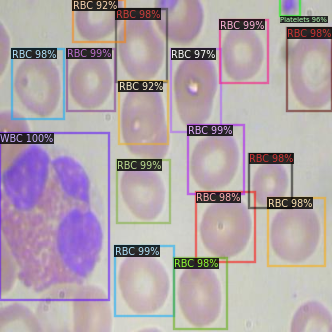

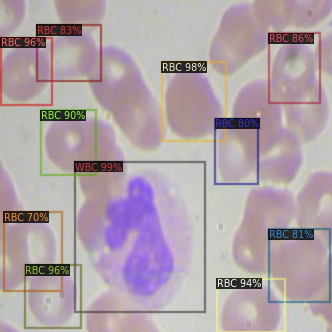

...

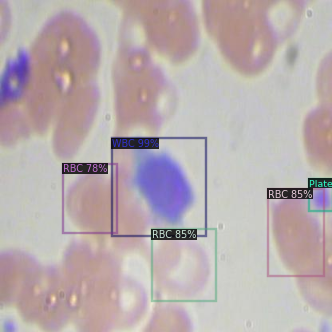

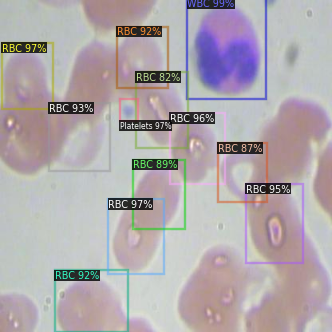

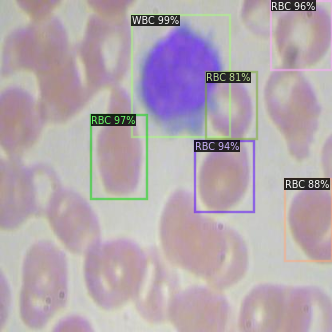

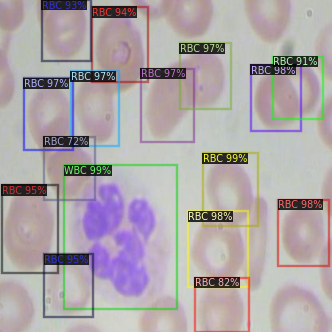

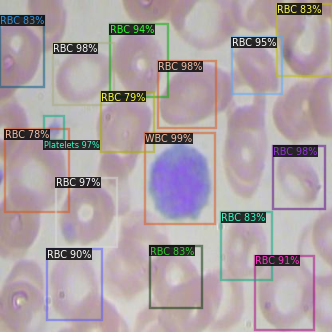

In [17]:
from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob('/content/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])
